# 21110308 - Truong Quoc Huy - IS - Lab05


In [1]:
%%capture
# Install ipykernel
!pip install ipykernel

# Install PyTorch with CUDA
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121

# Install additional dependencies
!pip install matplotlib pandas pillow torchtnt==0.2.0 tqdm tabulate

# Install package for creating visually distinct colormaps
!pip install distinctipy

# Install utility packages
!pip install cjm_pandas_utils cjm_psl_utils cjm_pil_utils cjm_pytorch_utils cjm_torchvision_tfms

In [2]:
import datetime as dt
import json
import math
import multiprocessing as mp
import os
import random
from functools import partial
from pathlib import Path
from pprint import pprint as pp
from typing import Callable, Dict, List, Optional, Tuple

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms.v2 as transforms
from cjm_pandas_utils.core import (
    markdown_to_pandas,
)
from cjm_pil_utils.core import get_img_files, resize_img, stack_imgs
from cjm_pytorch_utils.core import (
    get_torch_device,
    move_data_to_device,
    set_seed,
    tensor_to_pil,
)
from cjm_torchvision_tfms.core import CustomRandomIoUCrop, PadSquare, ResizeMax
from distinctipy import distinctipy
from PIL import Image, ImageDraw
from torch.amp import autocast
from torch.utils.data import DataLoader, Dataset
from torchtnt.utils import get_module_summary
from torchvision.models.detection import (
    maskrcnn_resnet50_fpn_v2,
)
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision.tv_tensors import BoundingBoxes, Mask
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks
from tqdm.auto import tqdm

torchvision.disable_beta_transforms_warning()

## Set seed


In [3]:
# Set the seed for generating random numbers in PyTorch, NumPy, and Python's random module.
seed = 242
set_seed(seed)

## Setting the Device and Data Type


In [4]:
device = get_torch_device()
dtype = torch.float32
device, dtype

('cpu', torch.float32)

## Get image files and annotations files


In [8]:
DATASET_DIR = Path(
    "./Lab05_IS_StudenID Dataset/Lab05 - StudenID Dataset/detection/student-id"
)

In [9]:
image_paths = sorted(get_img_files(DATASET_DIR))
annotation_paths = sorted(list(DATASET_DIR.glob("*.json")))

print(f"Number of images: {len(image_paths)}")

Number of images: 150


In [10]:
image_dicts = {img_path.stem: img_path for img_path in image_paths}
pd.DataFrame.from_dict(image_dicts, orient="index").head()

,0
10001,Lab05_IS_StudenID Dataset/Lab05 - StudenID Dat...
10002,Lab05_IS_StudenID Dataset/Lab05 - StudenID Dat...
10003,Lab05_IS_StudenID Dataset/Lab05 - StudenID Dat...
10004,Lab05_IS_StudenID Dataset/Lab05 - StudenID Dat...
10005,Lab05_IS_StudenID Dataset/Lab05 - StudenID Dat...


## Get Image Annotations


In [11]:
annotations = [json.loads(p.read_text()) for p in tqdm(annotation_paths)]

  0%|          | 0/150 [00:00<?, ?it/s]

In [12]:
annotations = pd.DataFrame(annotations)
annotations["index"] = annotations.apply(lambda x: x["imagePath"].split(".")[0], axis=1)
annotations = annotations.set_index("index")

annotations = annotations.loc[list(image_dicts.keys())]
annotations.head()

,version,flags,shapes,lineColor,fillColor,imagePath,imageData,imageHeight,imageWidth
index,,,,,,,,,
10001,3.21.1,{},"[{'label': 'student_id', 'line_color': None, '...","[0, 255, 0, 128]","[255, 0, 0, 128]",10001.jpg,,640,480
10002,3.21.1,{},"[{'label': 'student_id', 'line_color': None, '...","[0, 255, 0, 128]","[255, 0, 0, 128]",10002.jpg,,640,480
10003,3.21.1,{},"[{'label': 'student_id', 'line_color': None, '...","[0, 255, 0, 128]","[255, 0, 0, 128]",10003.jpg,,640,480
10004,3.21.1,{},"[{'label': 'student_id', 'line_color': None, '...","[0, 255, 0, 128]","[255, 0, 0, 128]",10004.jpg,,640,480
10005,3.21.1,{},"[{'label': 'student_id', 'line_color': None, '...","[0, 255, 0, 128]","[255, 0, 0, 128]",10005.jpg,,640,480


## Question 1: Analyzing the Dataset Student ID Information


### Tree structure of the Dataset Directory


In [13]:
!tree Lab05_IS_StudenID\ Dataset/Lab05\ -\ StudenID\ Dataset -L 2

Lab05_IS_StudenID Dataset/Lab05 - StudenID Dataset
├── detection
│   ├── classes.json
│   ├── student-id
│   ├── test.json
│   ├── train.json
│   └── valid.json
└── orientation
    ├── test
    ├── train
    └── valid

7 directories, 4 files


Cấu trúc của Dataset bao gồm 2 directory là detection và orientation

1. Detection

   Bên trong chứa các file json như: classes.json (chứa thông tin về số class và classname của chúng), test.json, train.json, valid.json (chứa đường dẫn của file ảnh cũng như file annotation tương ứng cho từng tập dữ liệu khác nhau)

2. Orientation

   Được chia thành 3 directory ứng với 3 tập dữ liệu train, test, valid chứa các hình ảnh được xoay chiều ở 4 góc độ 90, 180, 270, 360


### Example of Annotation File


In [14]:
pp(annotations.iloc[0].to_dict())

{'fillColor': [255, 0, 0, 128],
 'flags': {},
 'imageData': '',
 'imageHeight': 640,
 'imagePath': '10001.jpg',
 'imageWidth': 480,
 'lineColor': [0, 255, 0, 128],
 'shapes': [{'fill_color': None,
             'flags': {},
             'label': 'student_id',
             'line_color': None,
             'points': [[19.190476190476204, 244.76190476190476],
                        [23.0, 233.33333333333331],
                        [385.8571428571428, 132.38095238095238],
                        [400.1428571428571, 135.23809523809524],
                        [468.71428571428567, 353.3333333333333],
                        [466.80952380952374, 362.85714285714283],
                        [97.28571428571428, 478.0952380952381],
                        [81.09523809523807, 474.2857142857143]],
             'shape_type': 'polygon'}],
 'version': '3.21.1'}


File JSON bạn cung cấp chứa thông tin annotation cho một hình ảnh để phục vụ mô hình Mask R-CNN. Dưới đây là giải nghĩa từng key trong file json thuộc về bức ảnh `10001.jpg`

- `fillColor`: Màu tô cho phần được annotation, biểu diễn dưới dạng RGBA. Ví dụ: `[255, 0, 0, 128]` là màu đỏ với độ trong suốt 50% (128/255).

- `flags`: Một object trống dùng để lưu trữ các cờ tùy chỉnh (custom flags), trong trường hợp này là không có.

- `imageData`: Đây là trường giúp lưu trữ hình ảnh (các pixel) bên trong file json, nhưng không nhất thiết phải lưu ở đây vì đã có một file .jpg được lưu trữ bên ngoài

- `imageHeight`: Chiều cao của hình ảnh, ở đây là 640 pixel.

- `imagePath`: Đường dẫn đến file hình ảnh, ở đây là '10001.jpg'.

- `imageWidth`: Chiều rộng của hình ảnh, ở đây là 480 pixel.

- `lineColor`: Màu đường viền cho phần được annotation, biểu diễn dưới dạng RGBA. Ví dụ: `[0, 255, 0, 128]` là màu xanh lá cây với độ trong suốt 50% (128/255).

- `shapes`: Danh sách các hình dạng được annotation trong hình ảnh này. Mỗi phần tử trong danh sách là một object mô tả một hình dạng cụ thể. Trong trường hợp này, danh sách chứa một hình dạng duy nhất với các thuộc tính sau:

  - `fill_color`: Màu tô cho hình dạng cụ thể này, ở đây là `None` có nghĩa là không có màu tô cụ thể.
  - `flags`: Một object trống dùng để lưu trữ các cờ tùy chỉnh cho hình dạng cụ thể này, trong trường hợp này là không có.
  - `label`: Nhãn của hình dạng, ở đây là 'student_id'.
  - `line_color`: Màu đường viền cho hình dạng cụ thể này, ở đây là `None` có nghĩa là không có màu đường viền cụ thể.
  - `points`: Danh sách các điểm (tọa độ x, y) tạo thành hình dạng. Trong trường hợp này, hình dạng là một polygon (đa giác) với các điểm sau:
    - `[19.190476190476204, 244.76190476190476]`
    - `[23.0, 233.33333333333331]`
    - `[385.8571428571428, 132.38095238095238]`
    - `[400.1428571428571, 135.23809523809524]`
    - `[468.71428571428567, 353.3333333333333]`
    - `[466.80952380952374, 362.85714285714283]`
    - `[97.28571428571428, 478.0952380952381]`
    - `[81.09523809523807, 474.2857142857143]`
  - `shape_type`: Loại hình dạng, ở đây là 'polygon' nghĩa là đa giác.

- `version`: Phiên bản của phần mềm annotation, ở đây là '3.21.1'.


## Question 2: Train and save the model for 10, 20, 30, 40, and 50 epochs. Then, test the model on a randomly selected image.


In [15]:
# Define the font path
font_file = "./FiraCodeNerdFont-Bold.ttf"

### Define some functions


In [16]:
draw_bboxes: Callable = partial(
    draw_bounding_boxes, fill=False, width=2, font=font_file, font_size=25
)


def create_polygon_mask(
    image_size: Tuple[int, int], vertices: List[Tuple[int, int]]
) -> Image.Image:
    """
    Create a grayscale image with a white polygonal area on a black background.

    Parameters:
    - image_size (tuple): A tuple representing the dimensions (width, height) of the image.
    - vertices (list): A list of tuples, each containing the x, y coordinates of a vertex
                        of the polygon. Vertices should be in clockwise or counter-clockwise order.

    Returns:
    - PIL.Image.Image: A PIL Image object containing the polygonal mask.
    """

    # Create a new black image with the given dimensions
    mask_img = Image.new("L", image_size, 0)

    # Draw the polygon on the image. The area inside the polygon will be white (255).
    ImageDraw.Draw(mask_img, "L").polygon(vertices, fill=(255))

    # Return the image with the drawn polygon
    return mask_img

### Annotate sample image


Image size: 640x480


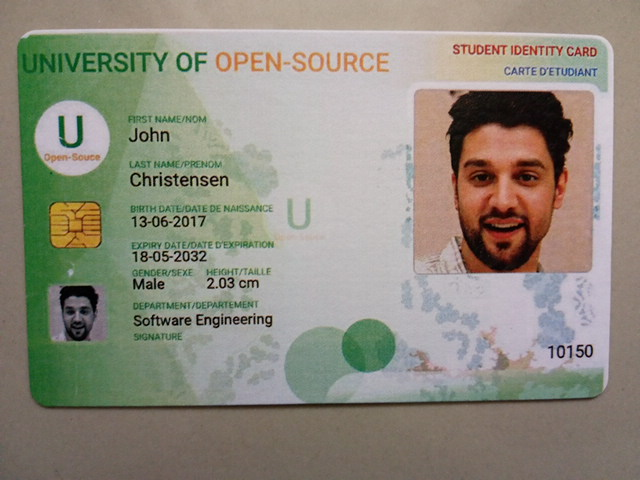

In [18]:
# Load sample image
sample_img_id = -1
sample_img = Image.open(image_paths[sample_img_id]).convert("RGB")

print(f"Image size: {sample_img.width}x{sample_img.height}")

display(sample_img)

### Generate color map


,0
0,background
1,student_id


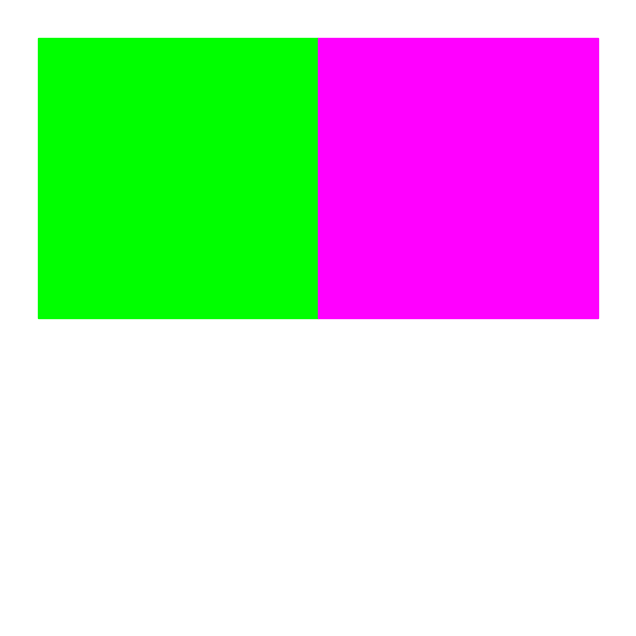

In [19]:
# Prepend a `background` class to the list of class names
classname = ["background"] + [annotations.iloc[sample_img_id]["shapes"][0]["label"]]
display(pd.DataFrame(classname))

# Gerate a list of distinct colors
colors = distinctipy.get_colors(len(classname))

# Make a copy of the color map in integer format
int_colors = [tuple(int(c * 255) for c in color) for color in colors]

# Plot the color swatch
distinctipy.color_swatch(colors)

In [20]:
# Extract the label
labels = [shape["label"] for shape in annotations.iloc[sample_img_id]["shapes"]]

# Extract the polygons points for segmentation mask
polygons = [shape["points"] for shape in annotations.iloc[sample_img_id]["shapes"]]
polygons = [[(x, y) for x, y in poly] for poly in polygons]
polygons

[[(15.857142857142847, 49.99999999999999),
  (21.57142857142857, 35.71428571428571),
  (37.999999999999986, 35.0),
  (592.9999999999999, 36.42857142857142),
  (605.1428571428571, 41.42857142857142),
  (607.9999999999999, 54.99999999999999),
  (604.4285714285713, 385.71428571428567),
  (599.4285714285713, 396.4285714285714),
  (60.85714285714285, 407.1428571428571),
  (47.28571428571428, 407.85714285714283),
  (35.85714285714285, 404.2857142857142),
  (30.14285714285714, 394.2857142857142)]]

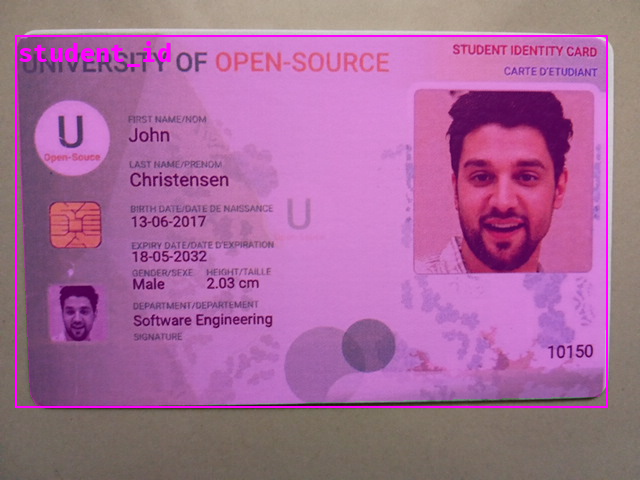

In [21]:
# Generate mask images
mask_imgs = [create_polygon_mask(sample_img.size, poly) for poly in polygons]

# Convert mask images to tensors
masks = torch.concat(
    [
        Mask(transforms.PILToTensor()(mask_img), dtype=torch.bool)
        for mask_img in mask_imgs
    ]
)

# Create colormap for each class
sample_colors = [int_colors[i] for i in [classname.index(label) for label in labels]]

# Gerate bounding boxes
bboxes = torchvision.ops.masks_to_boxes(masks)

# Annotate image
annotated_tensor = draw_segmentation_masks(
    image=transforms.PILToTensor()(sample_img),
    masks=masks,
    alpha=0.3,
    colors=sample_colors,
)
annotated_tensor = draw_bboxes(
    image=annotated_tensor,
    boxes=bboxes,
    labels=labels,
    colors=sample_colors,
)

# Show annotated image
display(tensor_to_pil(annotated_tensor))

### Loading the Mask R-CNN model


In [22]:
def get_model(weights: str = "DEFAULT") -> nn.Module:
    # Initialize a Mask R-CNN model with pretrained weights
    model = (
        maskrcnn_resnet50_fpn_v2(weights=weights)
        if weights == "DEFAULT"
        else maskrcnn_resnet50_fpn_v2()
    )

    # Get the number of input features for the classifier
    in_features_box = model.roi_heads.box_predictor.cls_score.in_features
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels

    # Get the numbner of output channels for the Mask Predictor
    dim_reduced = model.roi_heads.mask_predictor.conv5_mask.out_channels

    # Replace the box predictor
    model.roi_heads.box_predictor = FastRCNNPredictor(
        in_channels=in_features_box, num_classes=len(classname)
    )

    # Replace the mask predictor
    model.roi_heads.mask_predictor = MaskRCNNPredictor(
        in_channels=in_features_mask,
        dim_reduced=dim_reduced,
        num_classes=len(classname),
    )

    # Set the model's device and data type
    model.to(device=device, dtype=dtype)

    # Add attributes to store the device and model name for later reference
    model.device = device

    return model

In [40]:
model = get_model(weights="DEFAULT")

### Summarizing model


In [41]:
test_inp = torch.randn(1, 3, 256, 256).to(device)

summary_df = markdown_to_pandas(f"{get_module_summary(model.eval(), [test_inp])}")
summary_df.drop(
    ["In size", "Out size", "Contains Uninitialized Parameters?"], axis=1, inplace=True
)
summary_df.head(1)

/home/quochuy/miniconda3/envs/ISLab05/lib/python3.12/site-packages/torchtnt/utils/module_summary.py:271: UserWarning: Backward FLOPs are only computed if module foward returns a tensor.
  warnings.warn(


,Type,# Parameters,# Trainable Parameters,Size (bytes),Forward FLOPs
0,MaskRCNN,45.9 M,45.7 M,183 M,331 G


### Preparing the dataset


#### Training-Validation split


In [27]:
keys = list(image_dicts.keys())
random.shuffle(keys)

# Define the percentage of training data and valid data
train_pct = 0.8
valid_pct = 0.2

# Split the keys into training and validation sets
train_keys = keys[: int(len(keys) * train_pct)]
valid_keys = keys[int(len(keys) * train_pct) :]

# Print the number of images in the training and validation sets
pd.Series(
    {"Training Samples:": len(train_keys), "Validation Samples:": len(valid_keys)}
).to_frame().style.hide(axis="columns")

Training Samples:,120
Validation Samples:,30


### Setup Data Augmentation


In [28]:
iou_crop = CustomRandomIoUCrop(
    min_scale=0.3,
    max_scale=1.0,
    min_aspect_ratio=0.5,
    max_aspect_ratio=2.0,
    sampler_options=[0.0, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0],
    trials=400,
    jitter_factor=0.25,
)

train_img_size = 512
resize_max = ResizeMax(max_sz=512)
pad_square = PadSquare(shift=True, fill=0)

#### Test the transforms with a sample image


Source Image:,"(640, 480)"
Cropped Image:,"(627, 479)"
Resized Image:,"(511, 391)"
Padded Image:,"(511, 511)"
Resized Padded Image:,"(512, 512)"


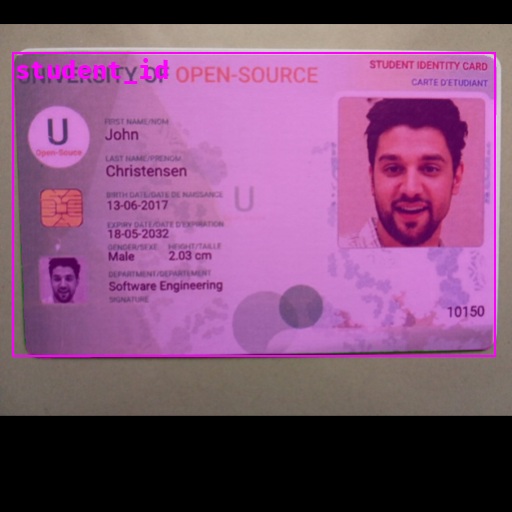

In [29]:
# Generate mask images
mask_imgs = [create_polygon_mask(sample_img.size, poly) for poly in polygons]

# Convert mask images to tensors
masks = torch.concat(
    [
        Mask(transforms.PILToTensor()(mask_img), dtype=torch.bool)
        for mask_img in mask_imgs
    ]
)

# Gerate bounding boxes
bboxes = BoundingBoxes(
    data=torchvision.ops.masks_to_boxes(masks),
    format="xyxy",
    canvas_size=sample_img.size[::-1],
)

# Prepare mask and bounding box targets
targets = {
    "masks": Mask(masks),
    "boxes": bboxes,
    "labels": torch.Tensor([classname.index(label) for label in labels]),
}

# Crop the image
cropped_img, targets = iou_crop(sample_img, targets)

# Resize the image
resized_img, targets = resize_max(cropped_img, targets)

# Pad the image
padded_img, targets = pad_square(resized_img, targets)

# Ensure the padded image is the target size
resize = transforms.Resize([train_img_size] * 2, antialias=True)
resized_padded_img, targets = resize(padded_img, targets)
sanitized_img, targets = transforms.SanitizeBoundingBoxes()(resized_padded_img, targets)

# Annotate image
annotated_tensor = draw_segmentation_masks(
    image=transforms.PILToTensor()(sanitized_img),
    masks=targets["masks"],
    alpha=0.3,
    colors=sample_colors,
)
annotated_tensor = draw_bboxes(
    image=annotated_tensor,
    boxes=targets["boxes"],
    labels=[classname[int(label)] for label in targets["labels"]],
    colors=sample_colors,
)

display(
    pd.Series(
        {
            "Source Image:": sample_img.size,
            "Cropped Image:": cropped_img.size,
            "Resized Image:": resized_img.size,
            "Padded Image:": padded_img.size,
            "Resized Padded Image:": resized_padded_img.size,
        }
    )
    .to_frame()
    .style.hide(axis="columns")
)

# Show annotated image
display(tensor_to_pil(annotated_tensor))

### Build Dataset Class


In [32]:
class StudentIDDataset(Dataset):
    """
    This class represents a PyTorch Dataset for a collection of images and their annotations.
    The class is designed to load images along with their corresponding segmentation masks, bounding box annotations, and labels.
    """

    def __init__(
        self,
        keys: List[int],
        annotations: pd.DataFrame,
        img_dict: Dict,
        class_to_idx: Dict,
        transforms: Optional[Callable] = None,
    ) -> None:
        """
        Constructor for the Dataset class

        Args:
            indices (List[int]): list of image indices
            annotations (pd.DataFrame): annotations for each image
            img_dict (Dict): Dictionary mappinng image index to image path
            class_to_idx (Dict): Dictionary mapping class name to class index
            transforms (Optional[Callable], optional): Optional transform to be applied on a sample. Defaults to None.
        """

        super(Dataset, self).__init__()

        self._keys = keys
        self._annotations = annotations
        self._img_dict = img_dict
        self._class_to_idx = class_to_idx
        self._transforms = transforms

    def __len__(self) -> int:
        return len(self._keys)

    def __getitem__(self, index) -> Tuple:
        idx = self._keys[index]
        series_annotation = self._annotations.loc[idx]
        image, target = self._load_image_and_target(series_annotation)

        return self._transforms(image, target) if self._transforms else (image, target)

    def _load_image_and_target(self, annotation: pd.Series) -> Tuple[Image.Image, Dict]:
        """
        Load an image and its target (bounding boxes and labels).

        Parameters:
        annotation (pd.Series): The annotations for an image.

        Returns:
        tuple: A tuple containing the image and a dictionary with 'boxes' and 'labels' keys.
        """

        # Load image
        filepath = self._img_dict[annotation.name]
        image = Image.open(filepath).convert("RGB")

        # Convert the class labels to indices
        labels = [shape["label"] for shape in annotation["shapes"]]
        labels = torch.Tensor([self._class_to_idx[label] for label in labels])
        labels = labels.to(dtype=torch.int64)

        # Convert polygons to mask image
        shape_points = [shape["points"] for shape in annotation["shapes"]]
        xy_coords = [[tuple(p) for p in points] for points in shape_points]
        mask_imgs = [create_polygon_mask(image.size, xy) for xy in xy_coords]
        masks = Mask(
            torch.concat(
                [
                    Mask(transforms.PILToTensor()(mask_img), dtype=torch.bool)
                    for mask_img in mask_imgs
                ]
            )
        )

        # Generate bounding box annotations from segmentation masks
        bboxes = BoundingBoxes(
            data=torchvision.ops.masks_to_boxes(masks),
            format="xyxy",
            canvas_size=image.size[::-1],
        )

        return image, {"masks": masks, "boxes": bboxes, "labels": labels}

In [34]:
# Compose transforms for data augmentation
data_aug_tfms = transforms.Compose(
    transforms=[
        iou_crop,
        transforms.ColorJitter(
            brightness=(0.875, 1.125),
            contrast=(0.5, 1.5),
            saturation=(0.5, 1.5),
            hue=(-0.05, 0.05),
        ),
        transforms.RandomGrayscale(),
        transforms.RandomEqualize(),
        transforms.RandomPosterize(bits=3, p=0.5),
        transforms.RandomHorizontalFlip(p=0.5),
    ],
)

# Compose transforms to resize and pad input images
resize_pad_tfm = transforms.Compose(
    [resize_max, pad_square, transforms.Resize([train_img_size] * 2, antialias=True)]
)

# Compose transforms to sanitize bounding boxes and normalize input data
final_tfms = transforms.Compose(
    [
        transforms.ToImage(),
        transforms.ToDtype(torch.float32, scale=True),
        transforms.SanitizeBoundingBoxes(),
    ]
)

# Define the transformations for training and validation datasets
train_tfms = transforms.Compose([data_aug_tfms, resize_pad_tfm, final_tfms])
valid_tfms = transforms.Compose([resize_pad_tfm, final_tfms])

In [35]:
# Create a mapping from class names to class indices
class_to_idx = {c: i for i, c in enumerate(classname)}

# Instantiate the datasets using the defined transformations
train_ds = StudentIDDataset(
    train_keys, annotations, image_dicts, class_to_idx, train_tfms
)
valid_ds = StudentIDDataset(
    valid_keys, annotations, image_dicts, class_to_idx, valid_tfms
)

# Print the number of samples in the training and validation datasets
pd.Series(
    {"Training dataset size:": len(train_ds), "Validation dataset size:": len(valid_ds)}
).to_frame().style.hide(axis="columns")

Training dataset size:,120
Validation dataset size:,30


### Testing the Dataset


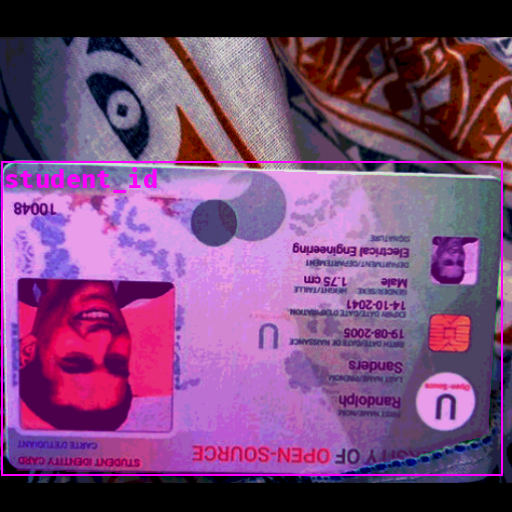

In [36]:
dataset_sample = train_ds[0]

# Get colors for dataset sample
sample_colors = [int_colors[int(i.item())] for i in dataset_sample[1]["labels"]]

# Annotate the sample image with segmentation masks
annotated_tensor = draw_segmentation_masks(
    image=(dataset_sample[0] * 255).to(dtype=torch.uint8),
    masks=dataset_sample[1]["masks"],
    alpha=0.3,
    colors=sample_colors,
)

# Annotate the sample image with bounding boxes
annotated_tensor = draw_bboxes(
    image=annotated_tensor,
    boxes=dataset_sample[1]["boxes"],
    labels=[classname[int(i.item())] for i in dataset_sample[1]["labels"]],
    colors=sample_colors,
)

tensor_to_pil(annotated_tensor)

### Initialize the Dataloaders


In [37]:
# Set the training batch size
BATCH_SIZE = 4

# Set the number of worker processes for loading data.
num_workers = mp.cpu_count()

# Define parameters for DataLoader
data_loader_params = {
    "batch_size": BATCH_SIZE,  # Batch size for data loading
    "num_workers": num_workers,  # Number of subprocesses to use for data loading
    "persistent_workers": True,  # If True, the data loader will not shutdown the worker processes after a dataset has been consumed once. This allows to maintain the worker dataset instances alive.
    "pin_memory": "cuda"
    in device,  # If True, the data loader will copy Tensors into CUDA pinned memory before returning them. Useful when using GPU.
    "pin_memory_device": (
        device if "cuda" in device else ""
    ),  # Specifies the device where the data should be loaded. Commonly set to use the GPU.
    "collate_fn": lambda batch: tuple(zip(*batch)),
}
# Create DataLoader for training data. Data is shuffled for every epoch.
train_dataloader = DataLoader(train_ds, **data_loader_params, shuffle=True)

# Create DataLoader for validation data. Shuffling is not necessary for validation data.
valid_dataloader = DataLoader(valid_ds, **data_loader_params)

# Print the number of batches in the training and validation DataLoaders
pd.Series(
    {
        "Number of batches in train DataLoader:": len(train_dataloader),
        "Number of batches in validation DataLoader:": len(valid_dataloader),
    }
).to_frame().style.hide(axis="columns")

Number of batches in train DataLoader:,30
Number of batches in validation DataLoader:,8


### Define the Training Loop


In [38]:
def run_epoch(
    model, dataloader, optimizer, lr_scheduler, device, scaler, epoch_id, is_training
):
    """
    Function to run a single training or evaluation epoch.

    Args:
        model: A PyTorch model to train or evaluate.
        dataloader: A PyTorch DataLoader providing the data.
        optimizer: The optimizer to use for training the model.
        loss_func: The loss function used for training.
        device: The device (CPU or GPU) to run the model on.
        scaler: Gradient scaler for mixed-precision training.
        is_training: Boolean flag indicating whether the model is in training or evaluation mode.

    Returns:
        The average loss for the epoch.
    """
    # Set the model to training mode
    model.train()

    epoch_loss = 0  # Initialize the total loss for this epoch

    # Loop over the data
    for batch_id, (inputs, targets) in enumerate(dataloader):
        # Move inputs and targets to the specified device
        inputs = torch.stack(inputs).to(device)

        # Forward pass with Automatic Mixed Precision (AMP) context manager
        with autocast(torch.device(device).type):
            if is_training:
                losses = model(inputs.to(device), move_data_to_device(targets, device))
            else:
                with torch.no_grad():
                    losses = model(
                        inputs.to(device), move_data_to_device(targets, device)
                    )

            # Compute the loss
            loss = sum([loss for loss in losses.values()])  # Sum up the losses

        # If in training mode, backpropagate the error and update the weights
        if is_training:
            if scaler:
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                old_scaler = scaler.get_scale()
                scaler.update()
                new_scaler = scaler.get_scale()
                if new_scaler >= old_scaler:
                    lr_scheduler.step()
            else:
                loss.backward()
                optimizer.step()
                lr_scheduler.step()

            optimizer.zero_grad()

        # Update the total loss
        loss_item = loss.item()
        epoch_loss += loss_item

        # If loss is NaN or infinity, stop training
        if is_training:
            stop_training_message = f"Loss is NaN or infinite at epoch {epoch_id}, batch {batch_id}. Stopping training."
            assert not math.isnan(loss_item) and math.isfinite(
                loss_item
            ), stop_training_message

    # Return the average loss for this epoch
    return epoch_loss / (batch_id + 1)


def train_loop(
    model,
    train_dataloader,
    valid_dataloader,
    optimizer,
    lr_scheduler,
    device,
    epochs,
    checkpoint_path,
    use_scaler=False,
):
    """
    Main training loop.

    Args:
        model: A PyTorch model to train.
        train_dataloader: A PyTorch DataLoader providing the training data.
        valid_dataloader: A PyTorch DataLoader providing the validation data.
        optimizer: The optimizer to use for training the model.
        lr_scheduler: The learning rate scheduler.
        device: The device (CPU or GPU) to run the model on.
        epochs: The number of epochs to train for.
        checkpoint_path: The path where to save the best model checkpoint.
        use_scaler: Whether to scale graidents when using a CUDA device

    Returns:
        None
    """
    # Initialize a gradient scaler for mixed-precision training if the device is a CUDA GPU
    scaler = (
        torch.cuda.amp.GradScaler() if device.type == "cuda" and use_scaler else None
    )
    best_loss = float("inf")  # Initialize the best validation loss

    # Loop over the epochs
    for epoch in tqdm(range(epochs), desc="Epochs"):
        # Run a training epoch and get the training loss
        train_loss = run_epoch(
            model,
            train_dataloader,
            optimizer,
            lr_scheduler,
            device,
            scaler,
            epoch,
            is_training=True,
        )
        # Run an evaluation epoch and get the validation loss
        with torch.no_grad():
            valid_loss = run_epoch(
                model,
                valid_dataloader,
                None,
                None,
                device,
                scaler,
                epoch,
                is_training=False,
            )

        # If the validation loss is lower than the best validation loss seen so far, save the model checkpoint
        if valid_loss < best_loss:
            best_loss = valid_loss
            torch.save(model.state_dict(), checkpoint_path)

            # Save metadata about the training process
            training_metadata = {
                "epoch": epoch,
                "train_loss": train_loss,
                "valid_loss": valid_loss,
                "learning_rate": lr_scheduler.get_last_lr()[0],
                "model_architecture": model.name,
            }
            with open(
                Path(checkpoint_path.parent / "training_metadata.json"), "w"
            ) as f:
                json.dump(training_metadata, f)

    # If the device is a GPU, empty the cache
    if device.type != "cpu":
        getattr(torch, device.type).empty_cache()

### Set the Model Checkpoint Path


In [42]:
# Generate timestamp for the training session (Year-Month-Day_Hour_Minute)
timestamp = dt.datetime.now().strftime("%Y-%m-%d")

# Create a directory to store the checkpoints if it does not already exist
checkpoint_dir = Path(f"./checkpoints/{timestamp}")

# Create the checkpoint directory if it does not already exist
checkpoint_dir.mkdir(parents=True, exist_ok=True)

### Configure the Training Parameters


In [43]:
# Learning rate for the model
lr = 5e-4

# AdamW optimizer; includes weight decay for regularization
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

### Train the Model


In [ ]:
for epoch in range(10, 60, 10):
    torch.cuda.empty_cache()

    # Learning rate scheduler; adjusts the learning rate during training
    lr_scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optimizer, max_lr=lr, total_steps=epoch * len(train_dataloader)
    )

    # The model checkpoint path
    model.name = f"mask-rcnn-resnet50-{epoch}epochs"
    checkpoint_path = checkpoint_dir / f"{model.name}.pth"
    print(checkpoint_path)

    train_loop(
        model=model,
        train_dataloader=train_dataloader,
        valid_dataloader=valid_dataloader,
        optimizer=optimizer,
        lr_scheduler=lr_scheduler,
        device=torch.device(device),
        epochs=epoch,
        checkpoint_path=checkpoint_path,
        use_scaler=True,
    )

### Making Predictions on one image


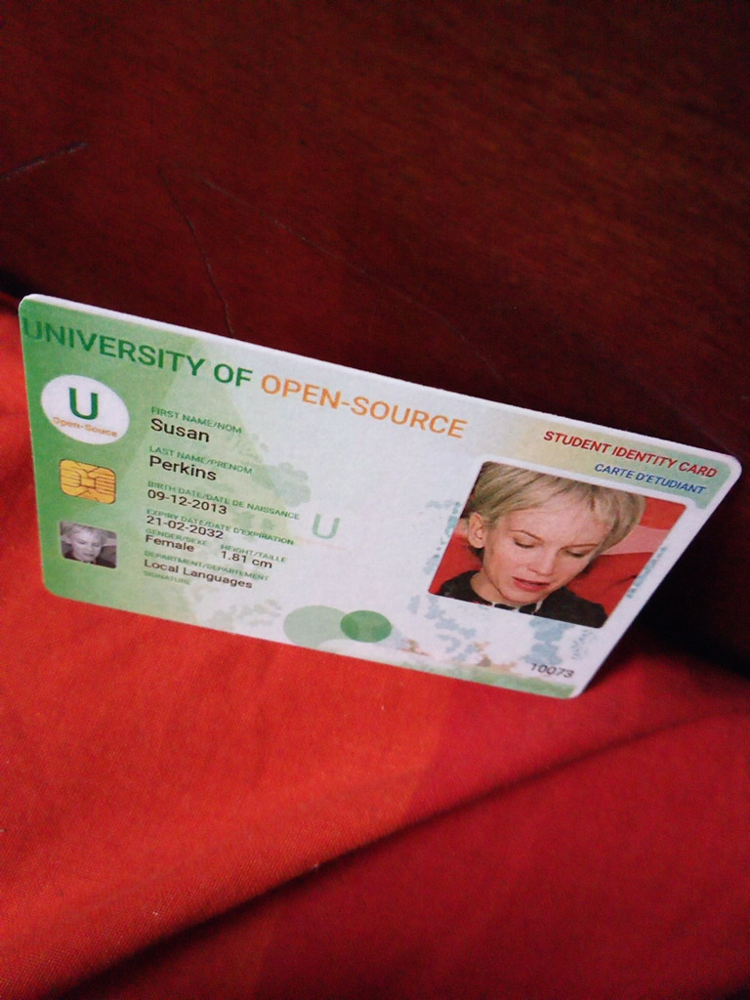

Source Image Size:,"(768, 1024)"
Input Dims:,"(512, 682)"
Min Image Scale:,1.500000
Input Image Size:,"(512, 682)"


In [44]:
# Choose a random item from the validation set
random_idx = random.choice(valid_keys)

# Retrieve the image file path associated with the file ID
test_file = image_dicts[random_idx]

# Open the test file
test_img = Image.open(test_file).convert("RGB")

# Resize the test image
input_img = resize_img(test_img, target_sz=train_img_size, divisor=1)

# Calculate the scale between the source image and the resized image
min_img_scale = min(test_img.size) / min(input_img.size)

display(test_img)

# Print the prediction data as a Pandas DataFrame for easy formatting
pd.Series(
    {
        "Source Image Size:": test_img.size,
        "Input Dims:": input_img.size,
        "Min Image Scale:": min_img_scale,
        "Input Image Size:": input_img.size,
    }
).to_frame().style.hide(axis="columns")

In [45]:
# Extract the polygon points for segmentation mask
target_shape_points = [
    shape["points"] for shape in annotations.loc[random_idx]["shapes"]
]
# Format polygon points for PIL
target_xy_coords = [[tuple(p) for p in points] for points in target_shape_points]
# Generate mask images from polygons
target_mask_imgs = [create_polygon_mask(test_img.size, xy) for xy in target_xy_coords]
# Convert mask images to tensors
target_masks = Mask(
    torch.concat(
        [
            Mask(transforms.PILToTensor()(mask_img), dtype=torch.bool)
            for mask_img in target_mask_imgs
        ]
    )
)

# Get the target labels and bounding boxes
target_labels = [shape["label"] for shape in annotations.loc[random_idx]["shapes"]]
target_bboxes = BoundingBoxes(
    data=torchvision.ops.masks_to_boxes(target_masks),
    format="xyxy",
    canvas_size=test_img.size[::-1],
)

In [57]:
checkpoint_dir = Path("./checkpoints/2024-07-04")

weights = []
for weight in os.listdir(checkpoint_dir):
    if weight.endswith(".pth"):
        weights.append(weight)

weights

['mask-rcnn-resnet50-40epochs.pth',
 'mask-rcnn-resnet50-30epochs.pth',
 'mask-rcnn-resnet50-50epochs.pth',
 'mask-rcnn-resnet50-20epochs.pth',
 'mask-rcnn-resnet50-10epochs.pth']

In [58]:
model_list = []
for weight in weights:
    model = get_model()
    model.name = weight.split(".")[0]
    model.load_state_dict(
        torch.load(str(checkpoint_dir / weight), map_location=torch.device("cpu"))
    )
    model_list.append(model)

____________________ {'mask-rcnn-resnet50-40epochs'} ____________________


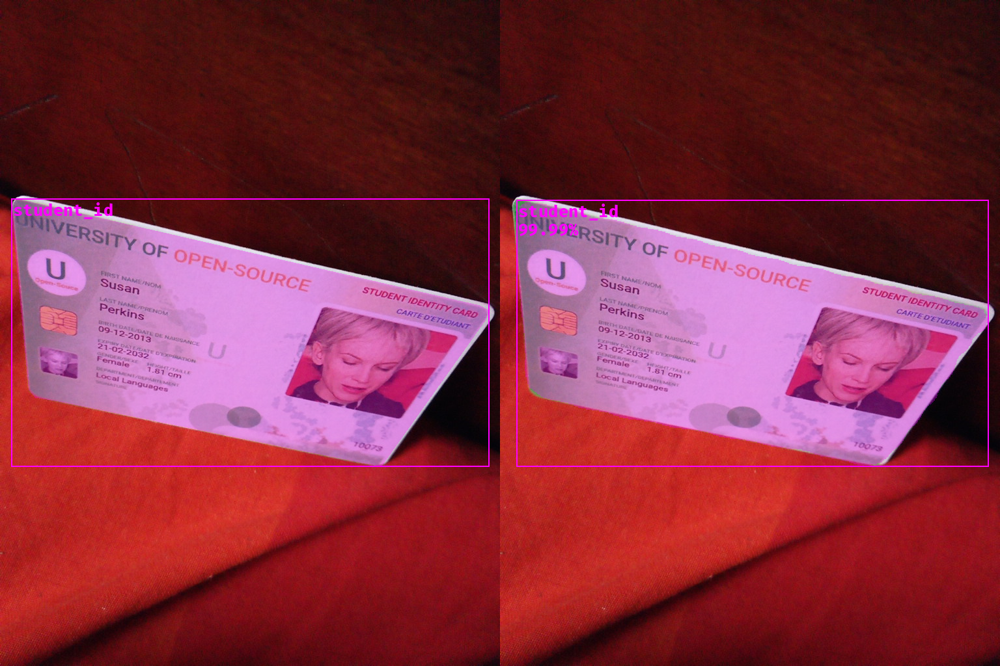

____________________ {'mask-rcnn-resnet50-30epochs'} ____________________


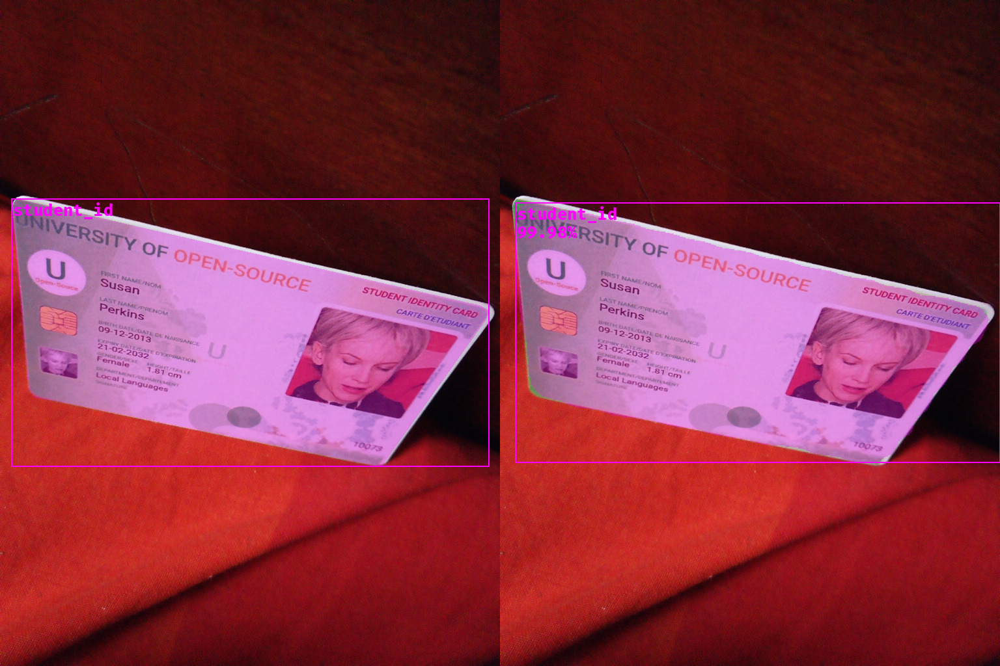

____________________ {'mask-rcnn-resnet50-50epochs'} ____________________


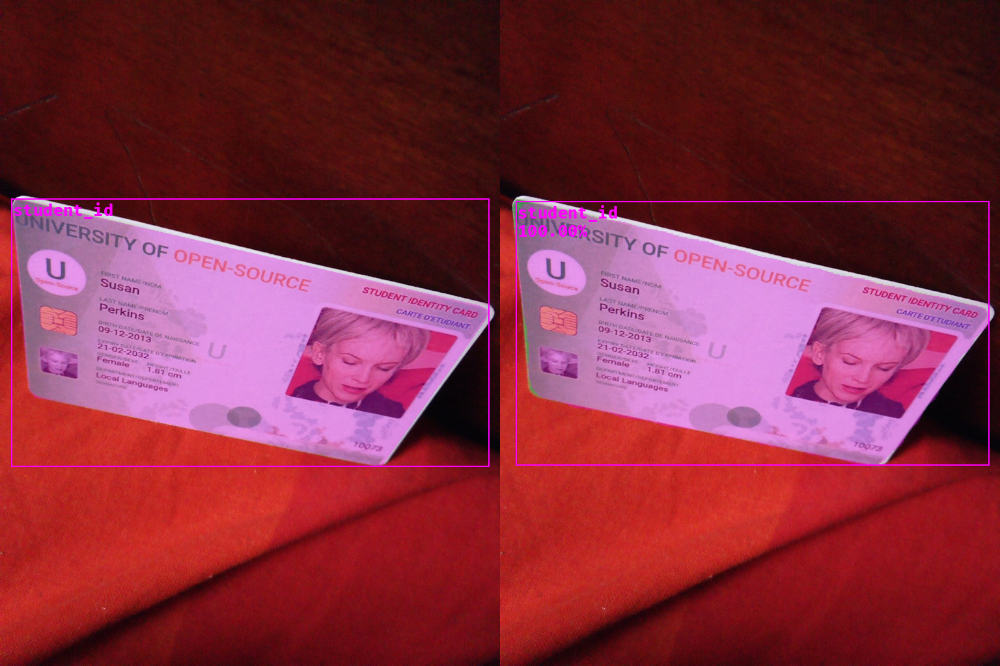

____________________ {'mask-rcnn-resnet50-20epochs'} ____________________


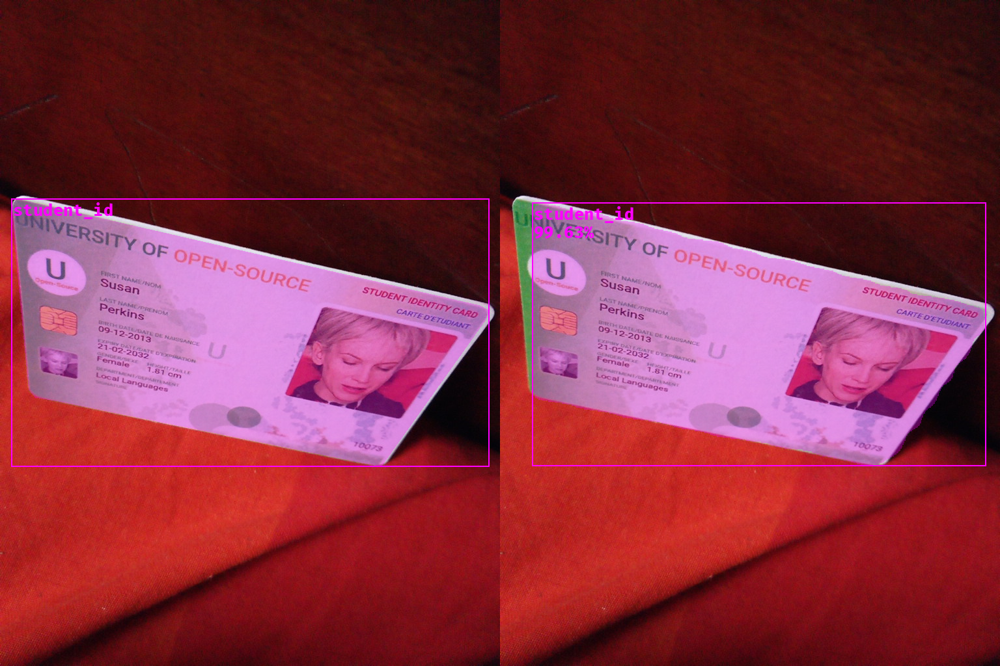

____________________ {'mask-rcnn-resnet50-10epochs'} ____________________


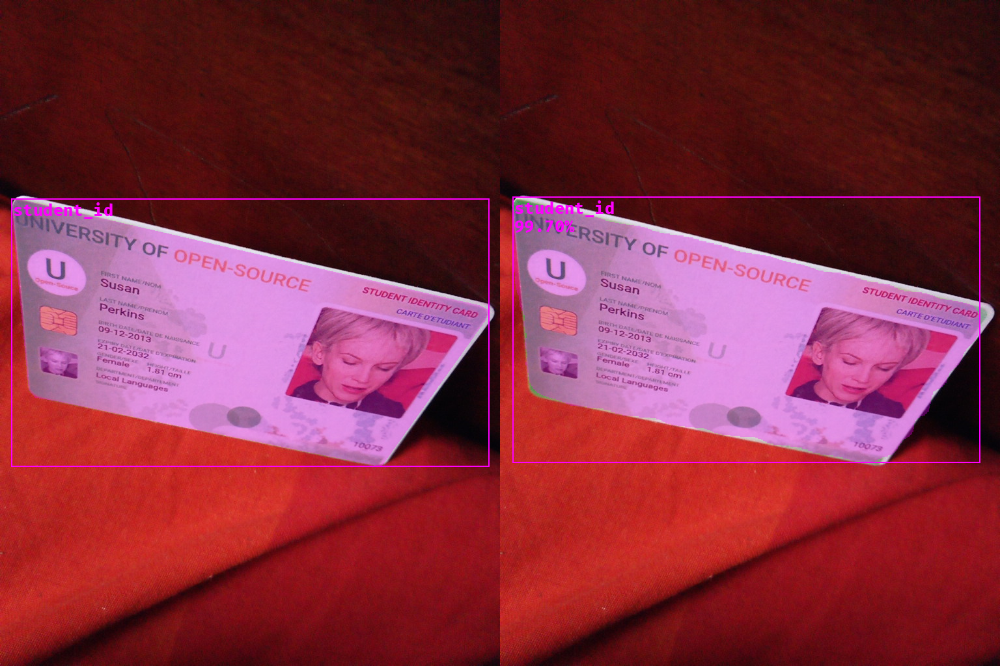

In [59]:
for model in model_list:
    print("_" * 20, {model.name}, "_" * 20)
    # Set the model to evaluation mode
    model.eval()

    # Ensure the model and input data are on the same device
    model.to(device)
    input_tensor = transforms.Compose(
        [transforms.ToImage(), transforms.ToDtype(torch.float32, scale=True)]
    )(input_img)[None].to(device)

    # Make a prediction with the model
    with torch.no_grad():
        model_output = model(input_tensor)

    # Set the confidence threshold
    threshold = 0.5

    # Move model output to the CPU
    model_output = move_data_to_device(model_output, "cpu")

    # Filter the output based on the confidence threshold
    scores_mask = model_output[0]["scores"] > threshold

    # Scale the predicted bounding boxes
    pred_bboxes = BoundingBoxes(
        model_output[0]["boxes"][scores_mask] * min_img_scale,
        format="xyxy",
        canvas_size=input_img.size[::-1],
    )

    # Get the class names for the predicted label indices
    pred_labels = [
        classname[int(label)] for label in model_output[0]["labels"][scores_mask]
    ]

    # Extract the confidence scores
    pred_scores = model_output[0]["scores"]

    # Scale and stack the predicted segmentation masks
    pred_masks = F.interpolate(
        model_output[0]["masks"][scores_mask], size=test_img.size[::-1]
    )
    pred_masks = torch.concat(
        [
            Mask(torch.where(mask >= threshold, 1, 0), dtype=torch.bool)
            for mask in pred_masks
        ]
    )

    # Get the annotation colors for the targets and predictions
    target_colors = [
        int_colors[i] for i in [classname.index(label) for label in target_labels]
    ]
    pred_colors = [
        int_colors[i] for i in [classname.index(label) for label in pred_labels]
    ]

    # Convert the test images to a tensor
    img_tensor = transforms.PILToTensor()(test_img)

    # Annotate the test image with the target segmentation masks
    annotated_tensor = draw_segmentation_masks(
        image=img_tensor, masks=target_masks, alpha=0.3, colors=target_colors
    )
    # Annotate the test image with the target bounding boxes
    annotated_tensor = draw_bboxes(
        image=annotated_tensor,
        boxes=target_bboxes,
        labels=target_labels,
        colors=target_colors,
    )
    # Display the annotated test image
    annotated_test_img = tensor_to_pil(annotated_tensor)

    # Annotate the test image with the predicted segmentation masks
    annotated_tensor = draw_segmentation_masks(
        image=img_tensor, masks=pred_masks, alpha=0.3, colors=pred_colors
    )
    # Annotate the test image with the predicted labels and bounding boxes
    annotated_tensor = draw_bboxes(
        image=annotated_tensor,
        boxes=pred_bboxes,
        labels=[
            f"{label}\n{prob*100:.2f}%" for label, prob in zip(pred_labels, pred_scores)
        ],
        colors=pred_colors,
    )

    # Display the annotated test image with the predicted bounding boxes
    display(stack_imgs([annotated_test_img, tensor_to_pil(annotated_tensor)]))

    # Print the prediction data as a Pandas DataFrame for easy formatting
    pd.Series(
        {
            "Target BBoxes:": [
                f"{label}:{bbox}"
                for label, bbox in zip(
                    target_labels, np.round(target_bboxes.numpy(), decimals=3)
                )
            ],
            "Predicted BBoxes:": [
                f"{label}:{bbox}"
                for label, bbox in zip(
                    pred_labels, pred_bboxes.round(decimals=3).numpy()
                )
            ],
            "Confidence Scores:": [
                f"{label}: {prob*100:.2f}%"
                for label, prob in zip(pred_labels, pred_scores)
            ],
        }
    ).to_frame().style.hide(axis="columns")